In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd

### Merge processes Restaurant Inspection and Open Restauran Application datasets

In [17]:
inspection = pd.read_csv('processed_data\\restaurant_inspection_data.csv')
open_restaurant = pd.read_csv('processed_data\\open_restaurant_data.csv')

In [18]:
merged_df = inspection.merge(open_restaurant,left_on=['ZIPCODE'], right_on=['Postcode']).drop(['Postcode'], axis=1)
merged_df

,ZIPCODE,SCORE,CRITICAL FLAG,ACTION,CUISINE DESCRIPTION_Afghan,CUISINE DESCRIPTION_African,CUISINE DESCRIPTION_American,CUISINE DESCRIPTION_Armenian,CUISINE DESCRIPTION_Asian/Asian Fusion,CUISINE DESCRIPTION_Australian,...,CUISINE DESCRIPTION_Turkish,CUISINE DESCRIPTION_Vegan,CUISINE DESCRIPTION_Vegetarian,AVG SCORE,AVG FLAGS,Sidewalk Dimensions (Area),Roadway Dimensions (Area),Approved for Sidewalk Seating,Approved for Roadway Seating,Qualify Alcohol
0,10001.0,3631.500000,447.333333,0.0,0,1,105,0,6,2,...,0,1,2,10.200843,1.256554,40093.0,32703.0,158,130,141
1,10002.0,3275.500000,396.500000,0.0,0,0,61,1,9,2,...,1,2,3,10.600324,1.283172,48627.0,37627.0,192,183,180
2,10003.0,4332.500000,487.000000,0.0,0,0,94,0,11,1,...,0,3,4,11.312010,1.271540,127047.0,90546.0,356,300,313
3,10004.0,886.500000,93.500000,0.0,0,0,30,0,3,0,...,0,0,0,9.532258,1.005376,9252.0,9820.0,28,26,29
4,10005.0,541.000000,56.500000,0.0,0,0,16,0,0,0,...,0,0,0,12.880952,1.345238,7245.0,1709.0,17,6,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180,11435.0,980.166667,115.166667,0.0,0,1,7,0,0,0,...,0,0,0,11.809237,1.387550,5686.0,2846.0,15,9,9
181,11691.0,375.000000,38.500000,0.0,0,0,0,0,0,0,...,0,0,0,11.718750,1.203125,390.0,0.0,1,0,0
182,11692.0,75.000000,8.000000,0.0,0,0,0,0,1,0,...,0,0,0,10.714286,1.142857,0.0,208.0,0,1,0
183,11693.0,161.000000,21.000000,0.0,0,0,6,0,0,0,...,0,0,0,9.470588,1.235294,628.0,1612.0,5,6,5


In [19]:
merged_df.columns

Index(['ZIPCODE', 'SCORE', 'CRITICAL FLAG', 'ACTION',
       'CUISINE DESCRIPTION_Afghan', 'CUISINE DESCRIPTION_African',
       'CUISINE DESCRIPTION_American', 'CUISINE DESCRIPTION_Armenian',
       'CUISINE DESCRIPTION_Asian/Asian Fusion',
       'CUISINE DESCRIPTION_Australian', 'CUISINE DESCRIPTION_Bagels/Pretzels',
       'CUISINE DESCRIPTION_Bakery Products/Desserts',
       'CUISINE DESCRIPTION_Bangladeshi', 'CUISINE DESCRIPTION_Barbecue',
       'CUISINE DESCRIPTION_Bottled Beverages',
       'CUISINE DESCRIPTION_Brazilian', 'CUISINE DESCRIPTION_Cajun',
       'CUISINE DESCRIPTION_Californian', 'CUISINE DESCRIPTION_Caribbean',
       'CUISINE DESCRIPTION_Chicken', 'CUISINE DESCRIPTION_Chilean',
       'CUISINE DESCRIPTION_Chinese', 'CUISINE DESCRIPTION_Chinese/Cuban',
       'CUISINE DESCRIPTION_Chinese/Japanese',
       'CUISINE DESCRIPTION_Coffee/Tea', 'CUISINE DESCRIPTION_Continental',
       'CUISINE DESCRIPTION_Creole', 'CUISINE DESCRIPTION_Creole/Cajun',
       'CUISINE D

#### Rat dataset

In [20]:
rats_df = pd.read_csv('C:\\Users\\abonc\\OneDrive\\CornellTech\\Classes\\INFO 5268 PAML\\Project\\311_Rodent_Complaints.csv')
rats_df

C:\Users\abonc\AppData\Local\Temp\ipykernel_15532\770539560.py:1: DtypeWarning: Columns (17,33) have mixed types. Specify dtype option on import or set low_memory=False.
  rats_df = pd.read_csv('C:\\Users\\abonc\\OneDrive\\CornellTech\\Classes\\INFO 5268 PAML\\Project\\311_Rodent_Complaints.csv')


,Unnamed: 0,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,...,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,due_date,facility_type
0,0,57410917,2023-04-25T02:02:31.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Other (Explain Below),11238.0,34 PLAZA STREET EAST,...,Unspecified,BROOKLYN,40.675289,-73.969558,"{'latitude': '40.67528940190247', 'longitude':...",NaN,NaN,NaN,NaN,NaN
1,1,57404236,2023-04-25T01:03:32.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11213.0,952 ST JOHNS PLACE,...,Unspecified,BROOKLYN,40.671427,-73.946582,"{'latitude': '40.671427363325506', 'longitude'...",NaN,NaN,NaN,NaN,NaN
2,2,57402819,2023-04-25T01:00:04.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11213.0,950 ST JOHNS PLACE,...,Unspecified,BROOKLYN,40.671430,-73.946629,"{'latitude': '40.671430129850734', 'longitude'...",NaN,NaN,NaN,NaN,NaN
3,3,57410183,2023-04-25T00:05:48.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Other (Explain Below),10019.0,701 9 AVENUE,...,Unspecified,MANHATTAN,40.762305,-73.989828,"{'latitude': '40.762304594502076', 'longitude'...",NaN,NaN,NaN,NaN,NaN
4,4,57404049,2023-04-24T23:37:06.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11225.0,426 EASTERN PARKWAY,...,Unspecified,BROOKLYN,40.670064,-73.954352,"{'latitude': '40.67006380965245', 'longitude':...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215912,215912,15633828,2010-01-01T14:15:27.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Vacant Building,11218.0,900 CONEY ISLAND AVENUE,...,Unspecified,BROOKLYN,40.635654,-73.967757,"{'latitude': '40.63565426900362', 'longitude':...",NaN,Please contact the Department of Health and Me...,2010-01-01T14:24:21.000,2010-01-31T14:15:27.000,NaN
215913,215913,15633897,2010-01-01T12:12:04.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,10458.0,2356 LORILLARD PLACE,...,Unspecified,BRONX,40.855513,-73.890006,"{'latitude': '40.85551279775197', 'longitude':...",NaN,Please contact the Department of Health and Me...,2010-01-01T12:22:16.000,2010-01-31T12:12:04.000,NaN
215914,215914,15633896,2010-01-01T12:11:51.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,10027.0,317 WEST 120 STREET,...,Unspecified,MANHATTAN,40.807367,-73.954388,"{'latitude': '40.807367287308594', 'longitude'...",NaN,Please contact the Department of Health and Me...,2010-01-01T12:18:09.000,2010-01-31T12:11:51.000,NaN
215915,215915,15633054,2010-01-01T11:20:45.000,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365.0,59-13 159 STREET,...,Unspecified,QUEENS,40.739983,-73.809299,"{'latitude': '40.73998332248969', 'longitude':...",NaN,Please contact the Department of Health and Me...,2010-01-01T11:30:23.000,2010-01-31T11:20:45.000,NaN


In [21]:
rats_df.columns

Index(['Unnamed: 0', 'unique_key', 'created_date', 'agency', 'agency_name',
       'complaint_type', 'descriptor', 'location_type', 'incident_zip',
       'incident_address', 'street_name', 'cross_street_1', 'cross_street_2',
       'intersection_street_1', 'intersection_street_2', 'address_type',
       'city', 'landmark', 'status', 'community_board', 'bbl', 'borough',
       'x_coordinate_state_plane', 'y_coordinate_state_plane',
       'open_data_channel_type', 'park_facility_name', 'park_borough',
       'latitude', 'longitude', 'location', 'closed_date',
       'resolution_description', 'resolution_action_updated_date', 'due_date',
       'facility_type'],
      dtype='object')

In [22]:
# keep only incident zipcode and date of complaint
rats_df = rats_df[['created_date', 'incident_zip']]
rats_df

,created_date,incident_zip
0,2023-04-25T02:02:31.000,11238.0
1,2023-04-25T01:03:32.000,11213.0
2,2023-04-25T01:00:04.000,11213.0
3,2023-04-25T00:05:48.000,10019.0
4,2023-04-24T23:37:06.000,11225.0
...,...,...
215912,2010-01-01T14:15:27.000,11218.0
215913,2010-01-01T12:12:04.000,10458.0
215914,2010-01-01T12:11:51.000,10027.0
215915,2010-01-01T11:20:45.000,11365.0


In [23]:
rats_df.dtypes

created_date     object
incident_zip    float64
dtype: object

In [24]:
# convert complaint date to datetime
rats_df['created_date'] = pd.to_datetime(rats_df['created_date'])

C:\Users\abonc\AppData\Local\Temp\ipykernel_15532\1838215366.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rats_df['created_date'] = pd.to_datetime(rats_df['created_date'])


In [25]:
# plot range for all rat complaints
fig = px.histogram(rats_df, x="created_date",marginal="box")
fig.show()

In [26]:
# filter out for rat complaints only in 2022
rats_2022_df = rats_df[(rats_df['created_date']>'2022') & (rats_df['created_date']<'2023')]

# plot 2022 rat complaints
fig = px.histogram(rats_2022_df, x="created_date",marginal="box")
fig.show()

In [27]:
rats_2022_df = rats_2022_df.groupby(by='incident_zip').count().reset_index()
rats_2022_df.rename(columns={'created_date': 'RAT COUNT'}, inplace=True)
rats_2022_df

,incident_zip,RAT COUNT
0,10001.0,114
1,10002.0,177
2,10003.0,221
3,10004.0,14
4,10005.0,11
...,...,...
175,11691.0,68
176,11692.0,7
177,11693.0,3
178,11694.0,12


### Merge rat data with restaurant prediction data

In [28]:
full_df = rats_2022_df.merge(merged_df, left_on=['incident_zip'], right_on=['ZIPCODE']).drop(['incident_zip'], axis=1)
full_df

,RAT COUNT,ZIPCODE,SCORE,CRITICAL FLAG,ACTION,CUISINE DESCRIPTION_Afghan,CUISINE DESCRIPTION_African,CUISINE DESCRIPTION_American,CUISINE DESCRIPTION_Armenian,CUISINE DESCRIPTION_Asian/Asian Fusion,...,CUISINE DESCRIPTION_Turkish,CUISINE DESCRIPTION_Vegan,CUISINE DESCRIPTION_Vegetarian,AVG SCORE,AVG FLAGS,Sidewalk Dimensions (Area),Roadway Dimensions (Area),Approved for Sidewalk Seating,Approved for Roadway Seating,Qualify Alcohol
0,114,10001.0,3631.500000,447.333333,0.0,0,1,105,0,6,...,0,1,2,10.200843,1.256554,40093.0,32703.0,158,130,141
1,177,10002.0,3275.500000,396.500000,0.0,0,0,61,1,9,...,1,2,3,10.600324,1.283172,48627.0,37627.0,192,183,180
2,221,10003.0,4332.500000,487.000000,0.0,0,0,94,0,11,...,0,3,4,11.312010,1.271540,127047.0,90546.0,356,300,313
3,14,10004.0,886.500000,93.500000,0.0,0,0,30,0,3,...,0,0,0,9.532258,1.005376,9252.0,9820.0,28,26,29
4,11,10005.0,541.000000,56.500000,0.0,0,0,16,0,0,...,0,0,0,12.880952,1.345238,7245.0,1709.0,17,6,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167,162,11435.0,980.166667,115.166667,0.0,0,1,7,0,0,...,0,0,0,11.809237,1.387550,5686.0,2846.0,15,9,9
168,68,11691.0,375.000000,38.500000,0.0,0,0,0,0,0,...,0,0,0,11.718750,1.203125,390.0,0.0,1,0,0
169,7,11692.0,75.000000,8.000000,0.0,0,0,0,0,1,...,0,0,0,10.714286,1.142857,0.0,208.0,0,1,0
170,3,11693.0,161.000000,21.000000,0.0,0,0,6,0,0,...,0,0,0,9.470588,1.235294,628.0,1612.0,5,6,5


### Add shapefile with geometry polygons for plotting

In [29]:
zipcodes = gpd.read_file('raw_data\\ZIP_CODE.zip')

In [30]:
# keep relevant columns
zipcodes = zipcodes[['ZIPCODE', 'POPULATION', 'AREA', 'geometry']]

# change zipcode to interger for merge
zipcodes['ZIPCODE'] = zipcodes['ZIPCODE'].astype(int)

In [31]:
# merge geodataframe into processed dataset
full_gdf = zipcodes.merge(full_df)
full_gdf.head()

,ZIPCODE,POPULATION,AREA,geometry,RAT COUNT,SCORE,CRITICAL FLAG,ACTION,CUISINE DESCRIPTION_Afghan,CUISINE DESCRIPTION_African,...,CUISINE DESCRIPTION_Turkish,CUISINE DESCRIPTION_Vegan,CUISINE DESCRIPTION_Vegetarian,AVG SCORE,AVG FLAGS,Sidewalk Dimensions (Area),Roadway Dimensions (Area),Approved for Sidewalk Seating,Approved for Roadway Seating,Qualify Alcohol
0,11213,62426.0,2.963100e+07,"POLYGON ((1001613.713 186926.440, 1002314.243 ...",384,810.5,100.5,0.0,0,1,...,0,0,1,10.952703,1.358108,4751.0,1848.0,14,9,8
1,11212,83866.0,4.197210e+07,"POLYGON ((1011174.276 183696.338, 1011373.584 ...",165,855.0,99.0,0.0,0,0,...,0,0,0,10.426829,1.207317,528.0,688.0,6,6,4
2,11225,56527.0,2.369863e+07,"POLYGON ((995908.365 183617.613, 996522.848 18...",364,1054.5,127.5,0.0,0,0,...,0,0,2,11.461957,1.385870,8963.0,4774.0,32,20,28
3,11218,72280.0,3.686880e+07,"POLYGON ((991997.113 176307.496, 992042.798 17...",315,1163.5,141.0,0.0,1,0,...,0,0,0,11.519802,1.396040,16750.0,5500.0,41,19,22
4,11226,106132.0,3.940860e+07,"POLYGON ((994821.473 177865.718, 994891.817 17...",627,1677.0,185.5,0.0,0,2,...,0,1,4,10.889610,1.204545,9653.0,3624.0,38,25,19


<AxesSubplot:>

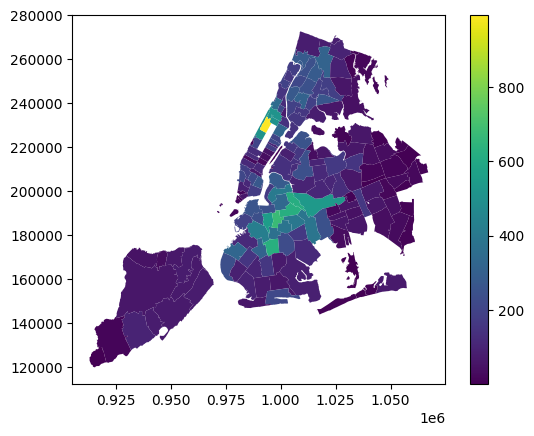

In [32]:
# fig, ax = plt.subplots(1, 1)
full_gdf.plot(column='RAT COUNT', legend=True)

<AxesSubplot:>

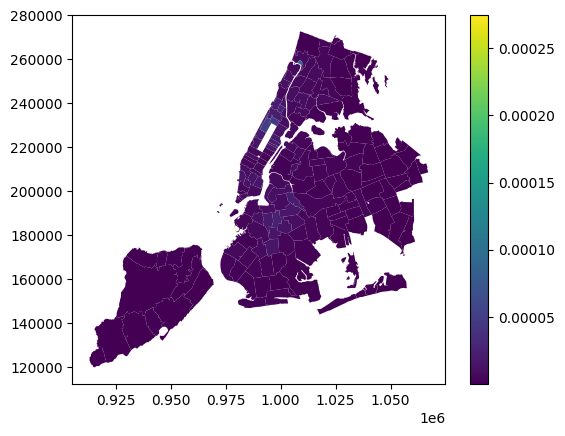

In [35]:
temp = full_gdf.copy()

temp['RATS PER AREA'] = temp['RAT COUNT'] / temp['AREA']
temp.plot(column='RATS PER AREA', legend=True)

<AxesSubplot:>

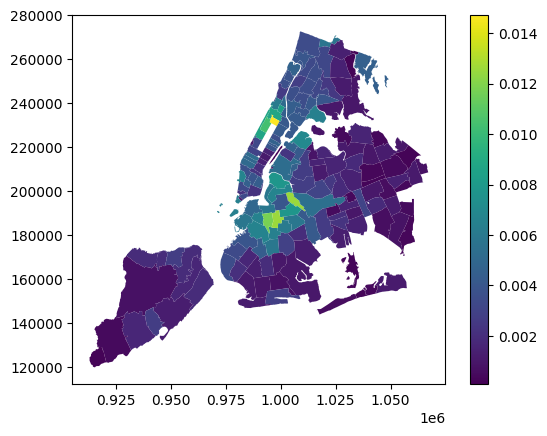

In [36]:
temp = full_gdf.copy()

temp['RATS PER POP'] = temp['RAT COUNT'] / temp['POPULATION']
temp.plot(column='RATS PER POP', legend=True)